In [1]:
!pip install opencv-python==4.4.0.42
!pip install --upgrade --no-cache-dir gdown

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.9/88.9 MB 6.8 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × pip subprocess to install build dependencies did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Installing build dependencies ... error
error: subprocess-exited-with-error

× pip subprocess to install build dependencies did not run successfully.
│ exit code: 1
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Attempting uninstall: gdown
    Found existing installation: gdown 4.6.6
    Uninstalling gdown-4.6.6:
      Successfully uninstalled gdown-4.6.6


In [2]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [3]:
!pwd

/content


# Задание 1


1.   С помощью библиотеки OpenCV считайте изображение.
2.   Постройте гистограмму черно-белого изображения.

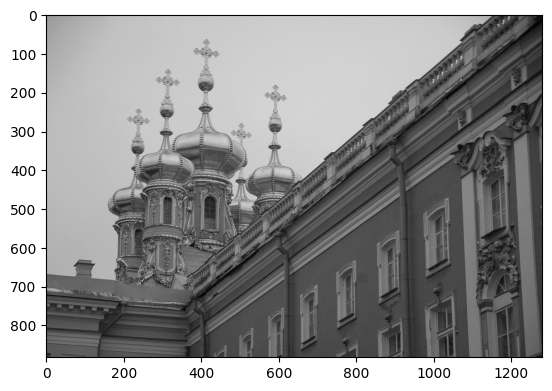

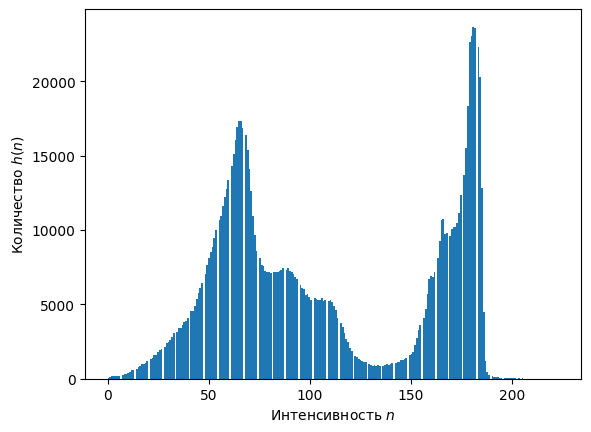

h(n):  23684.0
n:  180.31640625


In [5]:
img_1 = cv2.imread('/content/1.jpg')
gray_img_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2GRAY)
plt.imshow(gray_img_1, cmap='gray')
plt.show()

gray_hist = plt.hist(gray_img_1.ravel(), bins = 256)
plt.xlabel('Интенсивность $n$')
plt.ylabel('Количество $h(n)$')
plt.show()

x, y, _ = gray_hist
dict = {}
for i in range(len(x)):
  dict[x[i]] = y[i]
print('h(n): ', max(dict.keys()))
print('n: ', dict[max(dict.keys())])

# Задание 2


1.   С помощью библиотеки OpenCV считайте изображение.
2.   Постройте гистограмму изображения в палитре RGB. Сравните оценку плотностей распределения интенсивностей по каналам R, G и B.

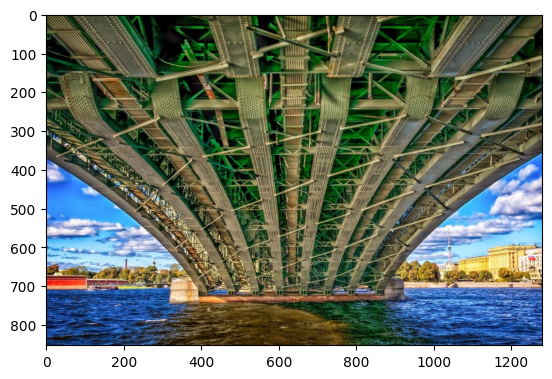

In [29]:
img2 = cv2.imread('/content/2.jpg')
RGB_img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
plt.imshow(RGB_img2)

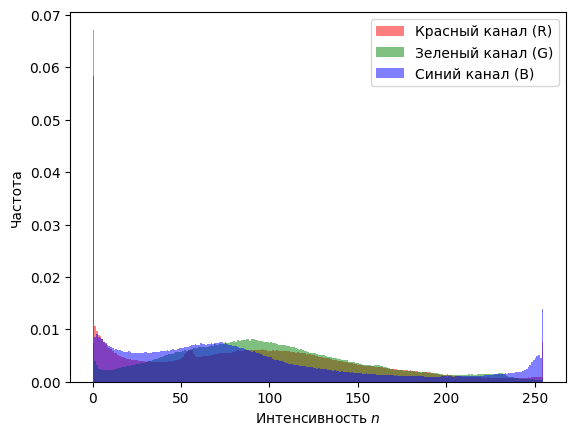

In [30]:
plt.hist(RGB_img2[:, :, 0].ravel(), bins = 256, color = 'Red', alpha = 0.5, density=True)
plt.hist(RGB_img2[:, :, 1].ravel(), bins = 256, color = 'Green', alpha = 0.5, density=True)
plt.hist(RGB_img2[:, :, 2].ravel(), bins = 256, color = 'Blue', alpha = 0.5, density=True)
plt.legend(['Красный канал (R)', 'Зеленый канал (G)', 'Cиний канал (B)'])
plt.xlabel('Интенсивность $n$')
plt.ylabel('Частота')
plt.show()

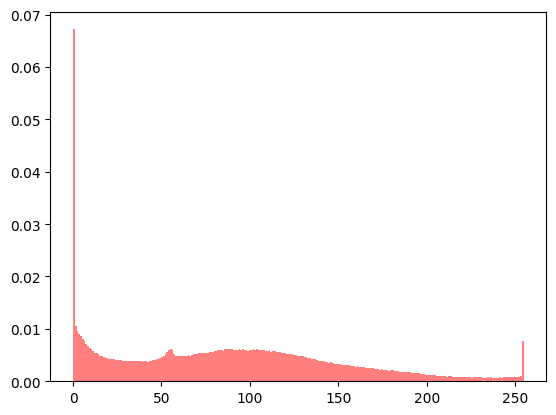

In [31]:
red_hist = plt.hist(RGB_img2[:, :, 0].ravel(), bins = 256, color = 'Red', alpha = 0.5, density=True)

In [33]:
round(max(red_hist[0]), 4)

0.0672

# Задание 3


1. С помощью библиотеки OpenCV считайте изображение.
2. Выполните линейную нормировку и растяжение на диапазон 0-255 гистограммы по каналам R, G и B.
3. Определите интенсивность каналов R, G, B для пикселя, находящегося на пересечении 434 строки и 663 столбца матричного представления изображения.

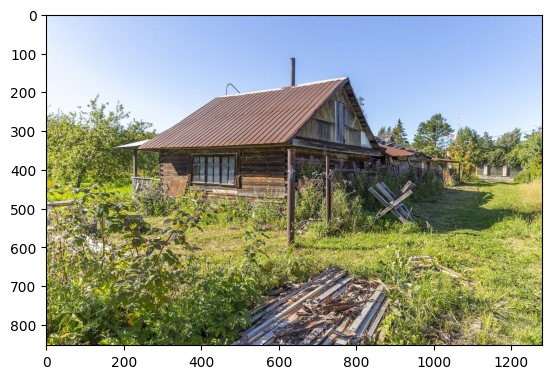

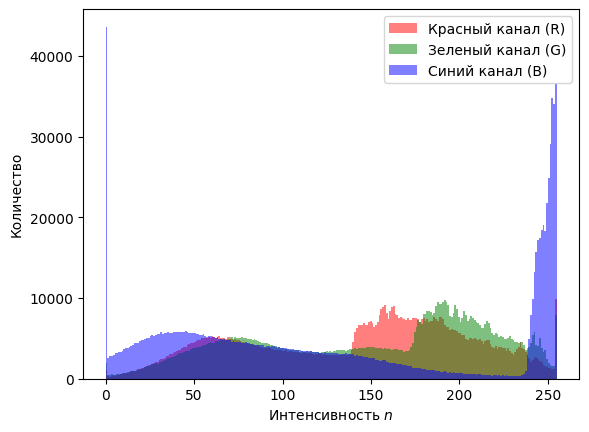

Red channel: 85
Green channel:  73
Blue channel:   61
85 , 73 , 61


In [68]:
img_3 = cv2.imread('/content/3.jpg')
RGB_img_3 = cv2.cvtColor(img_3, cv2.COLOR_BGR2RGB)
plt.imshow(RGB_img_3)
plt.show()

plt.hist(RGB_img_3[:, :, 0].ravel(), bins = 256, color = 'Red', alpha = 0.5)
plt.hist(RGB_img_3[:, :, 1].ravel(), bins = 256, color = 'Green', alpha = 0.5)
plt.hist(RGB_img_3[:, :, 2].ravel(), bins = 256, color = 'Blue', alpha = 0.5)
plt.legend(['Красный канал (R)', 'Зеленый канал (G)', 'Cиний канал (B)'])
plt.xlabel('Интенсивность $n$')
plt.ylabel('Количество')
plt.show()

RGB_img_3[:, :, 0] = (RGB_img_3[:, :, 0] - np.min(RGB_img_3[:, :, 0]))/(np.max(RGB_img_3[:, :, 0]) - np.min(RGB_img_3[:, :, 0]))*255
RGB_img_3[:, :, 1] = (RGB_img_3[:, :, 1] - np.min(RGB_img_3[:, :, 1]))/(np.max(RGB_img_3[:, :, 1]) - np.min(RGB_img_3[:, :, 1]))*255
RGB_img_3[:, :, 2] = (RGB_img_3[:, :, 2] - np.min(RGB_img_3[:, :, 2]))/(np.max(RGB_img_3[:, :, 2]) - np.min(RGB_img_3[:, :, 2]))*255

# Замените числа ниже, на ваши [строка][столбец]
R, G, B = RGB_img_3[434][663]
print('Red channel:', R)
print('Green channel: ', G)
print('Blue channel:  ', B)
print(R, ',', G, ',', B)

# Задание 4


1. С помощью библиотеки OpenCV считайте изображение.
2. Преобразуйте изображение в палитру RGB и примените гауссово ядро, используя метод cv2.GaussianBlur(), размер ядра (11, 11)
3. Получите изображение с деталями.

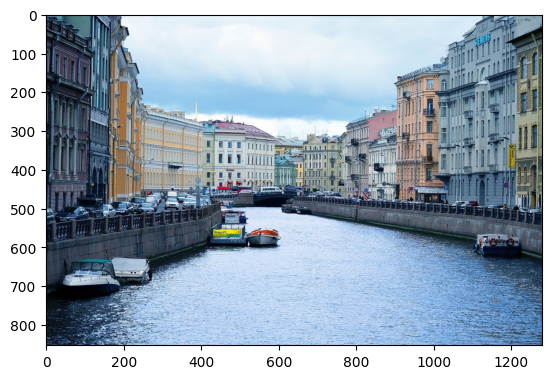

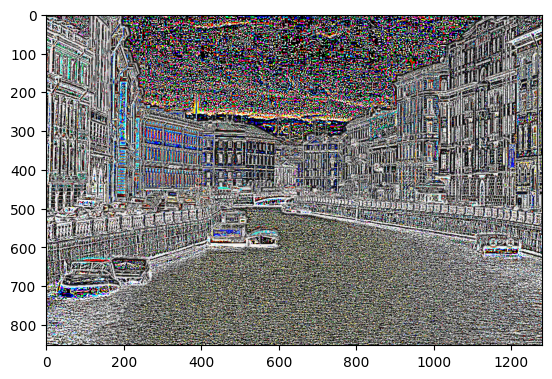

In [69]:
img_4 = cv2.imread('/content/4.jpg')
RGB_img_4 = cv2.cvtColor(img_4, cv2.COLOR_BGR2RGB)
plt.imshow(RGB_img_4)
plt.show()

RGB_img_4 = RGB_img_4 - cv2.GaussianBlur(RGB_img_4, (11, 11), 3)
plt.imshow(RGB_img_4)

# Задание 5


1. С помощью библиотеки OpenCV считайте черно-белое изображения с шумом типа "соль и перец".
2. Примените медианный фильтр cv2.medianBlur(source, ksize). Меняя значение аргумента ksize, восстановите двузначное число, указанное в левом верхнем углу изображения. Также Вам может потребоваться изменить гистограмму, подобрать ядро или воспользоваться изображением с деталями.

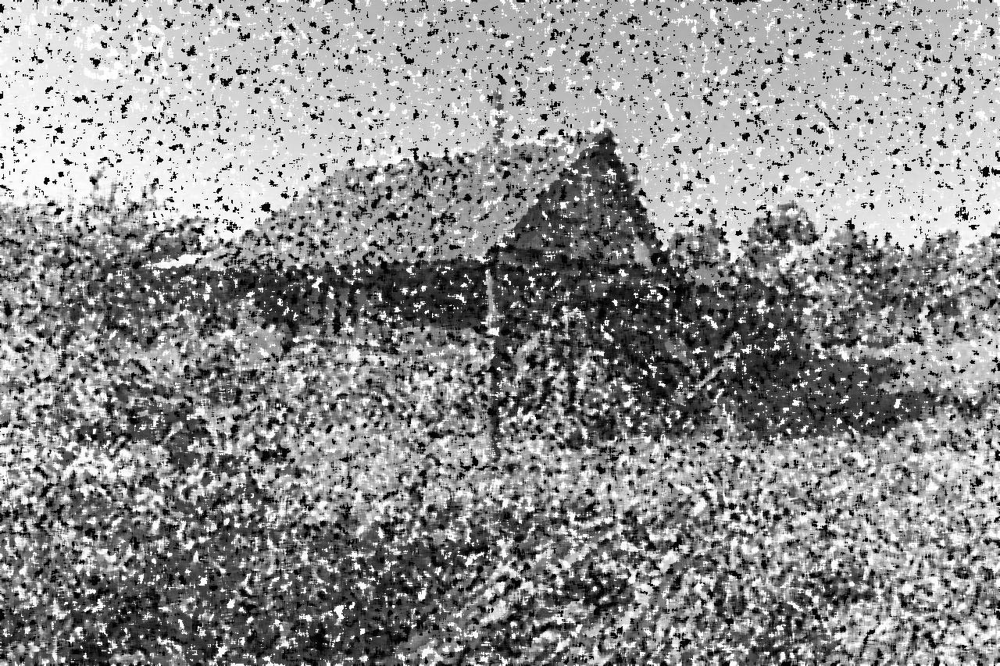

In [65]:
from google.colab.patches import cv2_imshow

# считываем изображение
img55 = cv2.imread('/content/5.jpg', cv2.IMREAD_GRAYSCALE)

# применяем медианный фильтр с ядром 7x7. Для улучшения результата Вы можете попробовать 
# изменять значение ksize в функции cv2.medianBlur() или использовать другие методы обработки изображений.
filtered_img = cv2.medianBlur(img55, 7)

# выводим результат
cv2_imshow(filtered_img)
cv2.waitKey(0)
cv2.destroyAllWindows()

# 11. Частотная фильтрация
/
## Упражнение 11

Задание 1

1. С помощью библиотеки OpenCV считайте изображение и преобразуйте в градации серого

2. Выполните дискретное преобразование Фурье. Определите компоненту полученного преобразования, находящуюся на пересечении 521 строки и 1151 столбца.

3. Переместите компоненту, отвечающую нулевой частоте f[0][0], в центр и замените все элементы матрицы их модулями — амплитудами.

4. Примените логарифмическое шкалирование.

5. Занулите амплитуду основных низких частот — матрица размера 80 x 80 в центре изображения (плюс/минус 40 пикселей от центра). За точку центра следует выбрать результат целочисленного деления на 2 ширины и высота изображения.

In [2]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
%matplotlib inline
import matplotlib as mpl

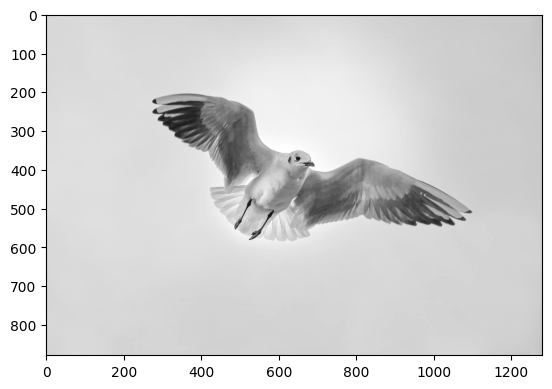

In [3]:
gray_img_11_1 = cv2.imread('/content/11_1.jpg')
gray_img_11_1 = cv2.cvtColor(gray_img_11_1, cv2.COLOR_BGR2GRAY) 
plt.imshow(gray_img_11_1, cmap = 'gray')
plt.show()

In [64]:
#2.
f = np.fft.fft2(gray_img_11_1)
print(f[521, 1151])
print('real: ', f[521, 1151].real)
print('imagine: ', f[521, 1151].imag)

(6831.004246867675-1906.875492496486j)
real:  6831.004246867675
imagine:  -1906.875492496486


In [45]:
round(6831.004246867675, 2)

6831.0

In [46]:
round(-1906.875492496486, 2)

-1906.88

In [65]:
# 3.
fshift = np.fft.fftshift(f)

magnitude_spectrum = np.abs(fshift)

print('min:', np.min(magnitude_spectrum))
print('max:', np.max(magnitude_spectrum))

min: 2.1500483729861677
max: 233949777.0


In [48]:
round(2.1500483729861677, 2)

2.15

In [49]:
round(233949777.0, 2)

233949777.0

In [66]:
# 4.

magnitude_spectrum = np.log(1+np.abs(fshift))
print("difference: ", np.max(magnitude_spectrum) - np.min(magnitude_spectrum))

difference:  18.12319921713216


In [51]:
round(18.12319921713216, 2)

18.12

In [7]:
# 5. Занулите амплитуду основных низких частот
f = np.fft.fft2(gray_img_11_1)
fshift = np.fft.fftshift(f)

center_x, center_y = np.array(fshift.shape) // 2  # наш центр
fshift[center_x - 40 : center_x + 40, center_y - 40 : center_y + 40] = 0 # зануляем в +- 40 пикселях от центра

# сдвиг + обратный fft
f_ishift = np.fft.ifftshift(fshift)
img_back = np.fft.ifft2(f_ishift)
img_back = np.abs(img_back)

amplitude = img_back[661, 449] 

print(f"амплитуда пересечения 661x449: {amplitude:.2f}")

амплитуда пересечения 661x449: 0.26


# Задание 2
С помощью библиотеки OpenCV считайте изображение.

Постройте градиенты изображений с помощью оператора Лапласа.

Примените алгоритм детектора краев Кенни.

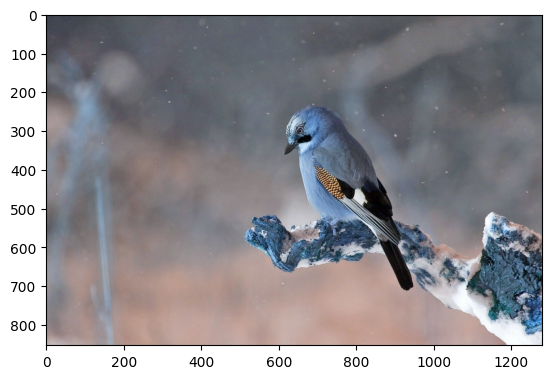

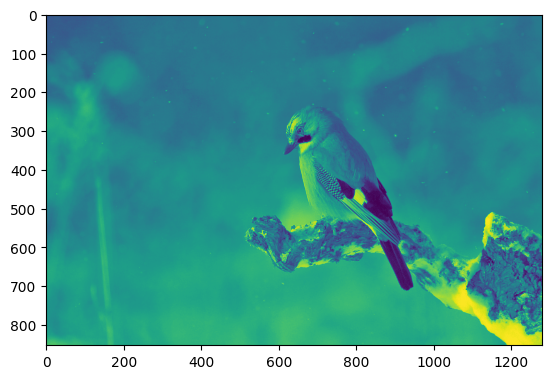

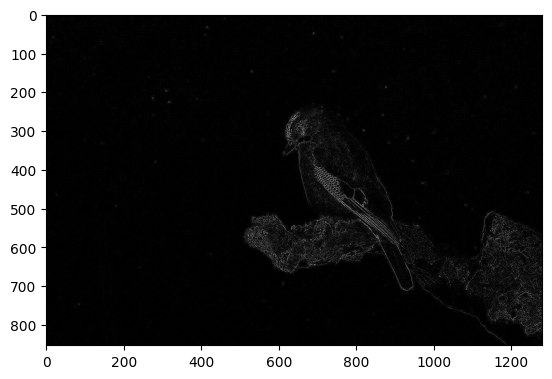

sum:  14951490


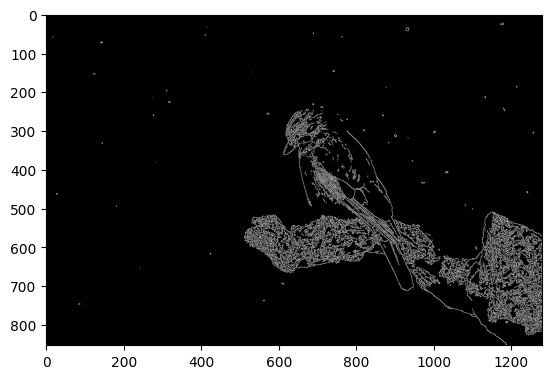

sum:  9443160


In [114]:
img_2 = cv2.imread('/content/11_2.jpg')

plt.imshow(img_2)
plt.show()

img = cv2.cvtColor(img_2, cv2.COLOR_BGR2GRAY)

plt.imshow(img)
plt.show()

laplacian = cv2.Laplacian(img_2, -1)
plt.imshow(laplacian)
plt.show()

print('sum: ', np.sum(laplacian))

canny = cv2.Canny(img_2, 100, 200)
plt.imshow(canny, cmap = 'gray')
plt.show()
print('sum: ', np.sum(canny))

# 12

In [115]:
import cv2
from matplotlib import pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg
import matplotlib as mpl
#mpl.rcParams['figure.dpi'] = 300
import pywt
import pywt.data
import numpy as np
from math import sqrt
from PIL import Image, ImageChops, ImageOps
import pickle

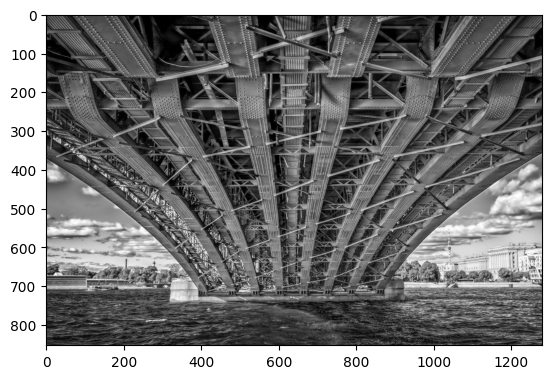

In [117]:
#1-2
img_1 = cv2.imread('/content/12_1.jpg')
img_gray_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2GRAY)
plt.imshow(img_gray_1,cmap='gray');

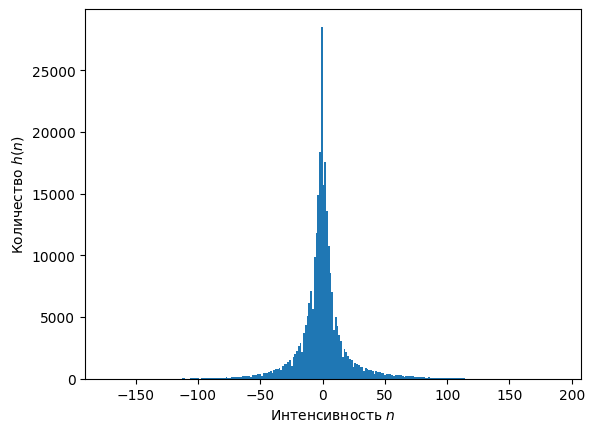

h(n):  28526.0
n:  -1.3984374999999716


In [120]:
#3
wavelet = 'haar'
c = pywt.dwt2(img_gray_1,wavelet)
cA, (cH, cV, cD)= c

cV_hist = plt.hist(cV.ravel(), bins = 256)
plt.xlabel('Интенсивность $n$')
plt.ylabel('Количество $h(n)$')
plt.show()

x, y, _ = cV_hist
dict = {}
for i in range(len(x)):
  dict[x[i]] = y[i]
print('h(n): ', max(dict.keys()))
print('n: ', dict[max(dict.keys())])

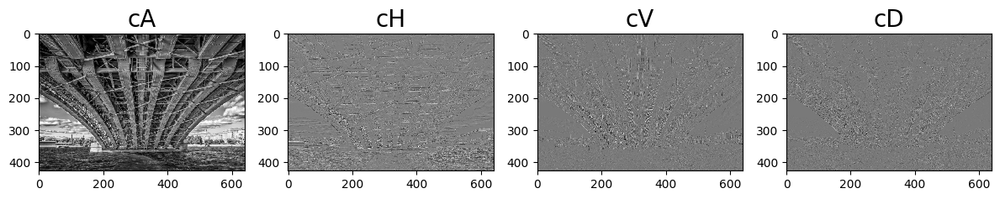

In [119]:
titles = ['cA', 'cH', 'cV', 'cD']
fig = plt.figure(figsize=(12, 3))
for i, a in enumerate([cA, cH, cV, cD]):
  ax = fig.add_subplot(1, 4, i + 1)
  ax.imshow(a, interpolation="nearest", cmap = 'gray')
  ax.set_title(titles[i], fontsize=20)
fig.tight_layout()
plt.show()

2

1. С помощью библиотеки OpenCV считайте изображение.

2. Выполните вейвлет-преобразование Хаара.

3. Выполните повторное вейвлет-преобразование Хаара для набора cA.

4. Обнулите коэффициенты меньшие по модулю значения threshold = 110 набора cA1. 
Введите количество таких коэффициентов:

5. Сохраните или отобразите полученное изображение.

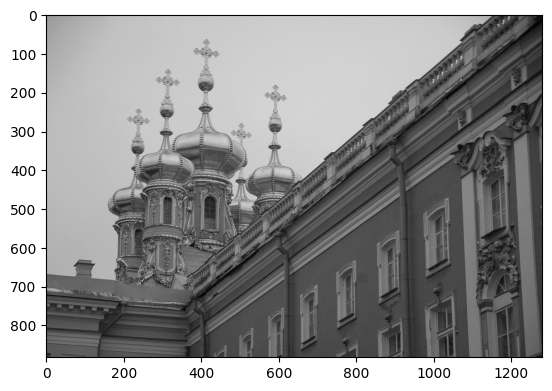

In [121]:
#1.
img_6 = cv2.imread('/content/12_2.jpg')
image = cv2.cvtColor(img_6, cv2.COLOR_BGR2GRAY)
plt.imshow(image, cmap='gray');

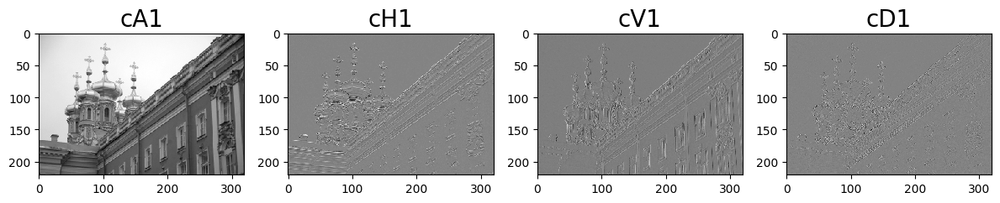

In [122]:
wavelet = 'haar'
cA = pywt.dwt2(image, wavelet)[0]

c = pywt.dwt2(cA,wavelet)
cA1, (cH1, cV1, cD1) = c
titles = ['cA1', 'cH1', 'cV1', 'cD1']
fig = plt.figure(figsize=(12, 3))
for i, a in enumerate([cA1, cH1, cV1, cD1]):
  ax = fig.add_subplot(1, 4, i + 1)
  ax.imshow(a, interpolation="nearest", cmap = 'gray')
  ax.set_title(titles[i], fontsize=20)
fig.tight_layout()
plt.show()

In [123]:
threshold = 110
h1 = cA1.shape[0] # у нас все наборы имеют вид квадратной матрицы
for i in range(h1):
      c[0][i][np.abs(c[0][i])<threshold] = 0.0 # для cA
print('Количество нулей =',(sum(sum(c[0][m] == 0) for m in range(h1))))

Количество нулей = 772


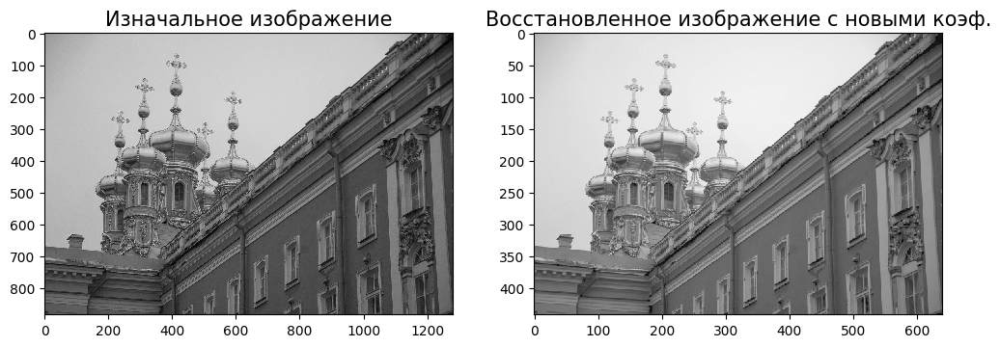

In [124]:
c_inverse1 = pywt.idwt2((c),wavelet)#[:h,:w]  # коэф. с обнулены в предыдущем строке
titles1 = ['Изначальное изображение', 'Восстановленное изображение c новыми коэф.']
fig1 = plt.figure(figsize=(12, 6))
for i, a in enumerate([image, c_inverse1]):
  ax = fig1.add_subplot(1, 2, i + 1)
  ax.imshow(a, interpolation="nearest", cmap = 'gray')
  ax.set_title(titles1[i], fontsize=15)
fig.tight_layout()
plt.show()

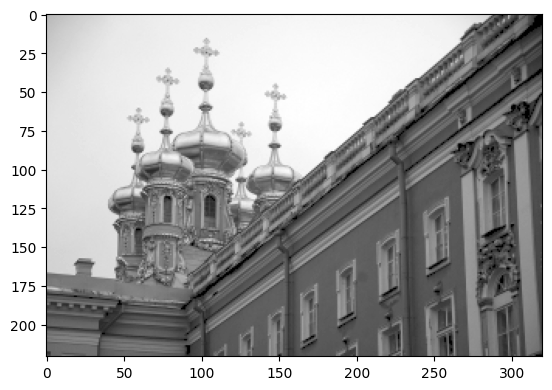

In [125]:
plt.imshow(c[0], cmap='gray');

In [126]:
cv2.imwrite('1111.jpg', c[0])

True

## 13

In [24]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg
import matplotlib as mpl
from PIL import Image
mpl.rcParams['figure.dpi'] = 200

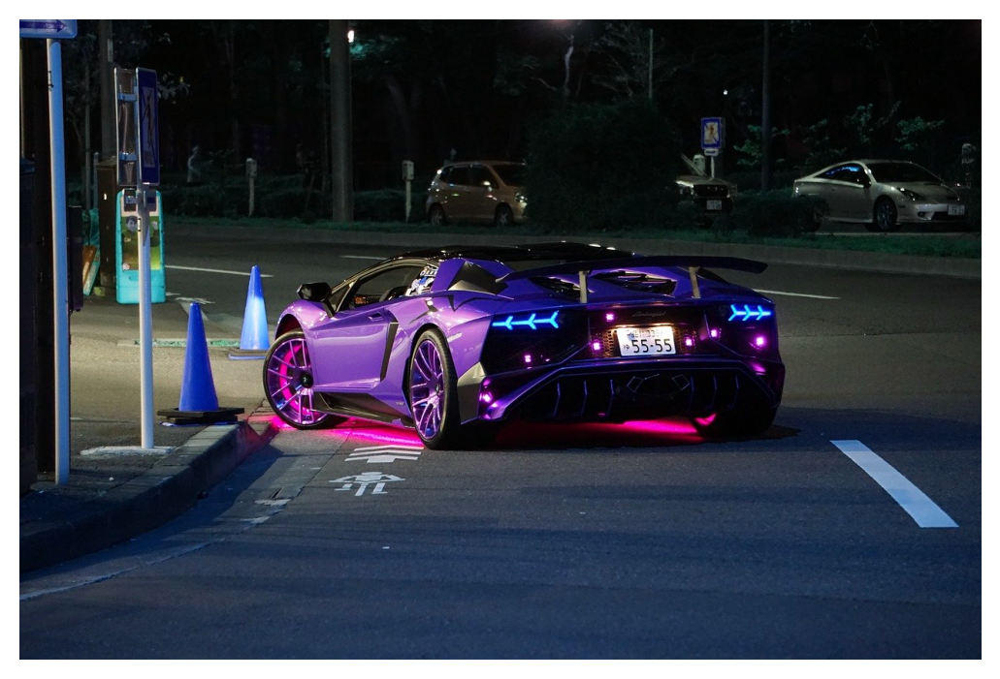

In [25]:
img_1 = cv2.imread('/content/13.jpg')
plt.axis('off')
plt.imshow(img_1)

Высота:  150
Ширина:  145


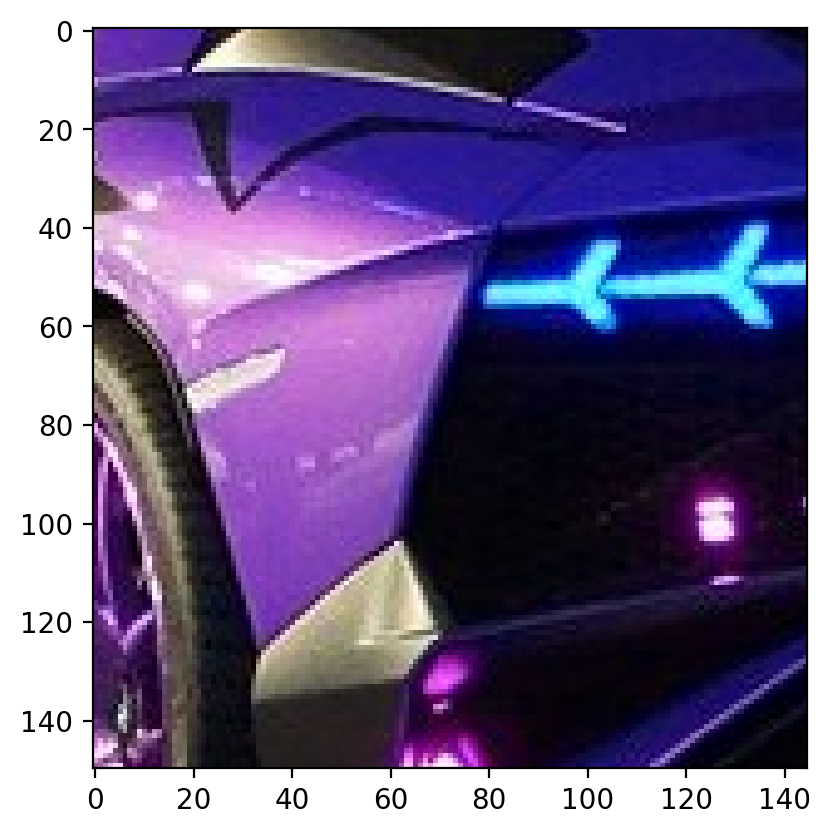

In [26]:
crop_img_1 = img_1[353:503, 550:695]
h, w, c = crop_img_1.shape
plt.imshow(crop_img_1)
print('Высота: ', h)
print('Ширина: ', w)

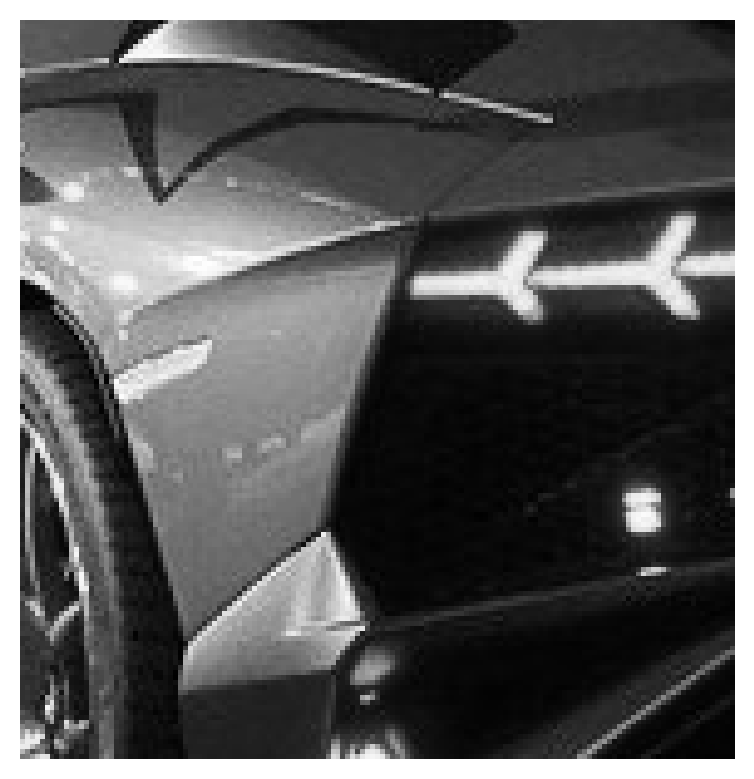

In [27]:
crop_img_gray = cv2.cvtColor(crop_img_1, cv2.COLOR_BGR2GRAY)
plt.axis('off')
plt.imshow(crop_img_gray, cmap='gray')

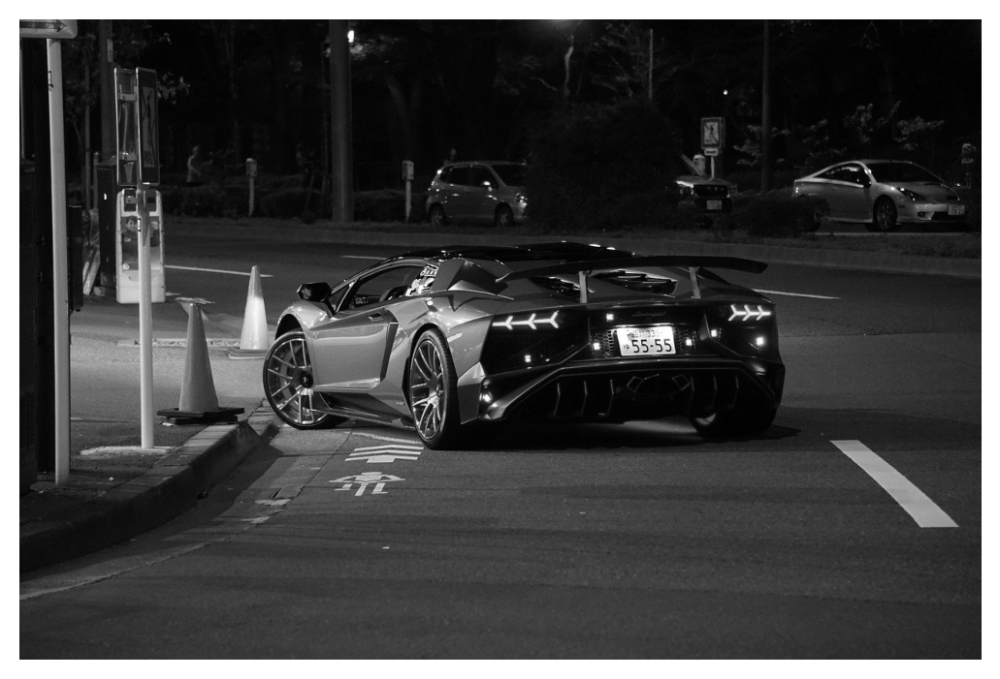

In [28]:
img_gray = cv2.cvtColor(img_1, cv2.COLOR_BGR2GRAY)
plt.axis('off')
plt.imshow(img_gray, cmap='gray')

In [29]:
sift = cv2.xfeatures2d.SIFT_create()
kp1, des1 = sift.detectAndCompute(crop_img_gray, None) 
kp2, des2 = sift.detectAndCompute(img_gray, None)

bf = cv2.BFMatcher(cv2.NORM_L1,crossCheck=True) 
#crossCheck=false - совпадения вида один ко многим, crossCheck=true - совпадения вида один к одному
matches = bf.match(des1,des2)

matches = sorted(matches, key = lambda x:x.distance) 
print('Количество совпадений ', len(matches))
for i in range(0,5): #выведем первые 3 
  print('Расстояние ',matches[i].distance,'Индекс 1 ',matches[i].trainIdx,'Индекс 2 ', matches[i].queryIdx)

Количество совпадений  99
Расстояние  0.0 Индекс 1  1324 Индекс 2  16
Расстояние  0.0 Индекс 1  1330 Индекс 2  18
Расстояние  0.0 Индекс 1  1331 Индекс 2  19
Расстояние  0.0 Индекс 1  1334 Индекс 2  21
Расстояние  0.0 Индекс 1  1335 Индекс 2  22


In [30]:
print('Расстояние ',matches[0].distance,'Индекс 1 ',matches[0].trainIdx,'Индекс 2 ', matches[0].queryIdx)

Расстояние  0.0 Индекс 1  1324 Индекс 2  16


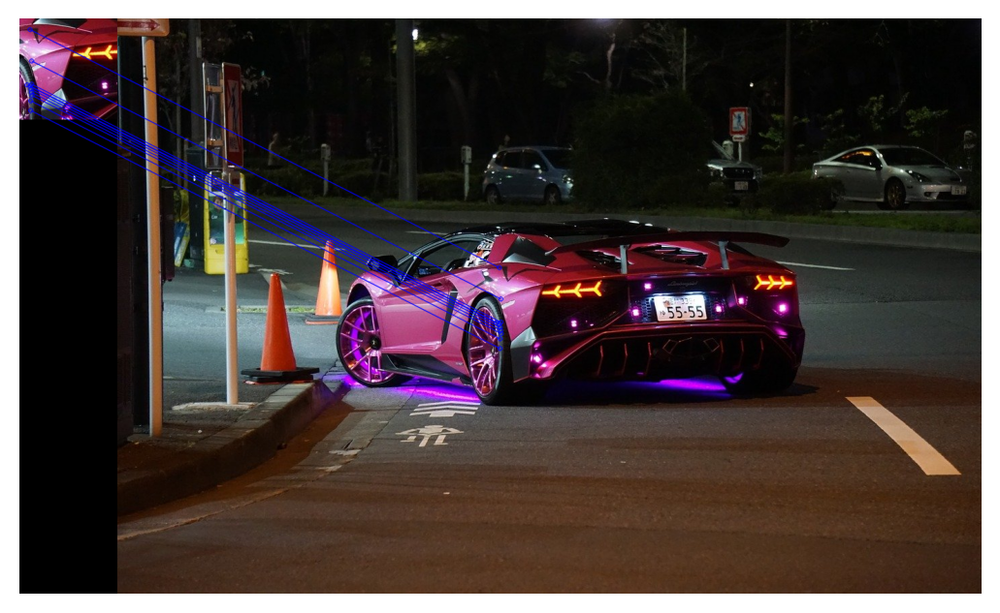

In [31]:
matching_result = cv2.drawMatches(crop_img_1, kp1, img_1, kp2, matches[:10], None, [255,0,0], flags=2)
mpl.rcParams['figure.dpi'] = 200
plt.axis('off')
plt.imshow(cv2.cvtColor(matching_result, cv2.COLOR_BGR2RGB))

x:  561
y:  451
95 , 71 , 83


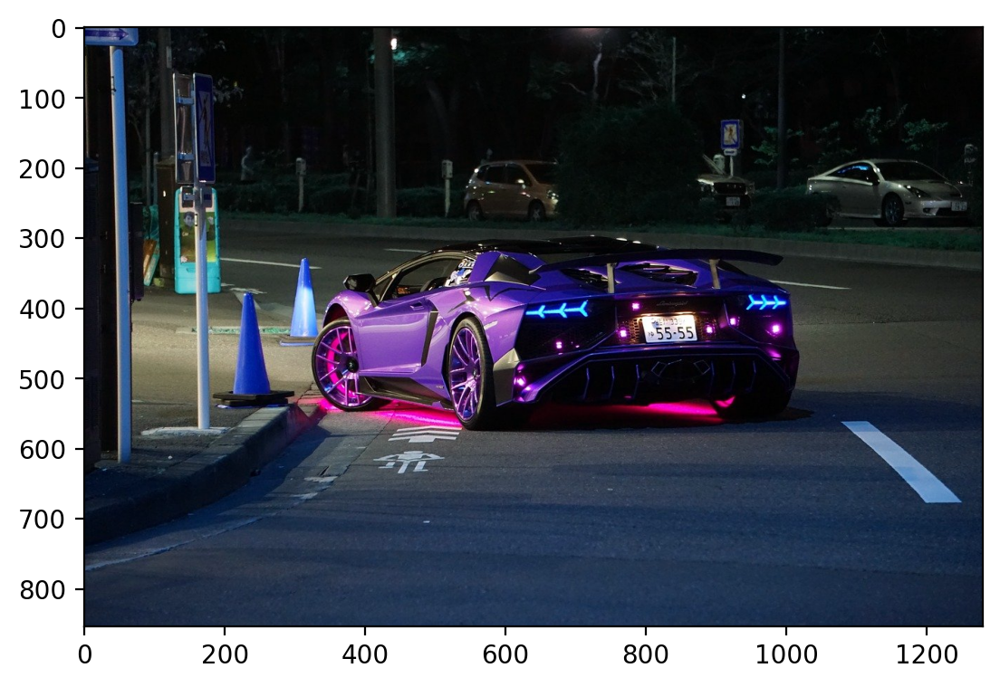

In [33]:
x = np.float32([kp2[matches[0].trainIdx].pt])[0][0]
y = np.float32([kp2[matches[0].trainIdx].pt])[0][1]
print('x: ', round(x))
print('y: ', round(y))

x_int = int(round(x))
y_int = int(round(y))
B, G, R = img_1[y_int][x_int]
print(B, ',', G, ',', R)
plt.imshow(img_1)